## 3. Pattern Analysis and Hierarchical Decomposition through Time-Based Aggregation

**Overview:**
- In this notebook, to gain a more intuitive understanding of the effects of multiple periodicities that were difficult to interpret with the MSTL decomposition in the previous chapter, we attempt time-based aggregation analysis (by time of day, day of week, and month) and a simplified hierarchical decomposition utilizing it.

### 3-1. Preparation for Analysis

In [1]:
# Import libraries
from pathlib import Path
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import STL
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import matplotlib.pyplot as plt

from src.data_utils import load_timeseries_data, validate_no_missing

import warnings
# Suppress warnings
warnings.filterwarnings("ignore")

# Configure Japanese font (to prevent garbled characters) windows or mac
plt.rcParams['font.family'] = 'Meiryo' # For Windows
# plt.rcParams['font.family'] = 'Hiragino Sans' # For Mac

In [2]:
# load data
BASE_DIR = Path().resolve()
DATA_DIR = BASE_DIR.parent / "data"
target_file = DATA_DIR / "e_gen_demand.csv"

df = load_timeseries_data(target_file)
df.head()

# Missing value check
validate_no_missing(df)

# Anomalies such as division by zero are not considered for now; data is extracted as is.
series_gen = df['solar_gen_mw'].copy() # Generation
series_demand = df['e_demand_mw'].copy() # Consumption

print("Data preparation complete. Analysis period: ", series_gen.index.min(), " ~ ", series_gen.index.max())

Missing value check completed: No missing values in any column
Data preparation complete. Analysis period:  2023-01-01 00:00:00  ~  2025-03-31 23:30:00


### 3-2. Visualization of Contributing Factors through Time-Based Aggregation

**Purpose and Metrics of Aggregation Analysis**
- In the MSTL decomposition of the previous section, interpreting each component was difficult due to the complex effects of multiple cycles. Therefore, this section aims to perform time-based average aggregations, such as by time slot (30-minute intervals), day of the week, and month, to more intuitively and quantitatively grasp the main variation patterns in the time series.

**Data Definition and Characteristics**
- TEPCO service area: Solar power generation and electricity consumption, unit: MW (megawatts), 30-minute intervals
- Both generation and consumption likely have periodicities of 48 intervals per day, 336 intervals per week, and 17,520 intervals per year.
- Factors are estimated to include solar incidence angle, temperature, and human behavior on weekdays/weekends (for consumption only?).

#### 3-2-1. Periodic Pattern Analysis of Power Generation (solar_gen_mw)

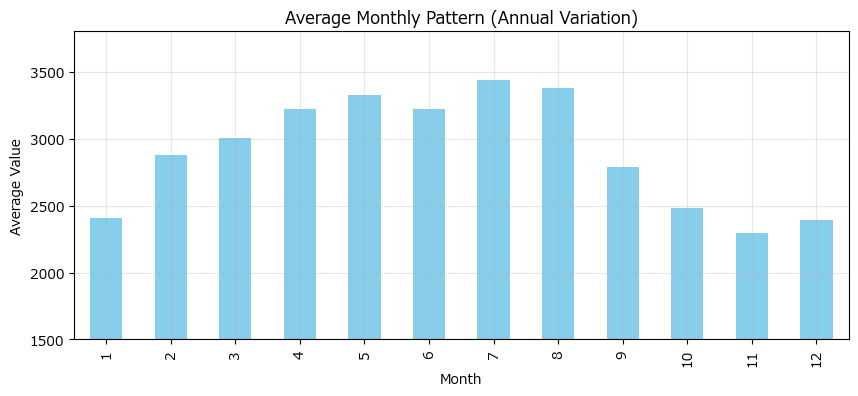

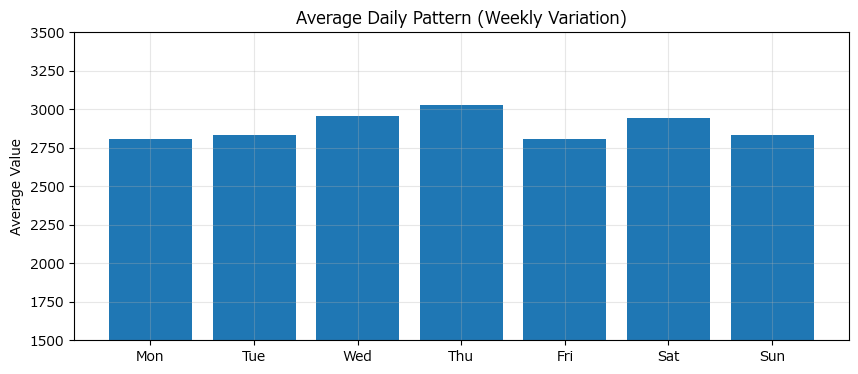

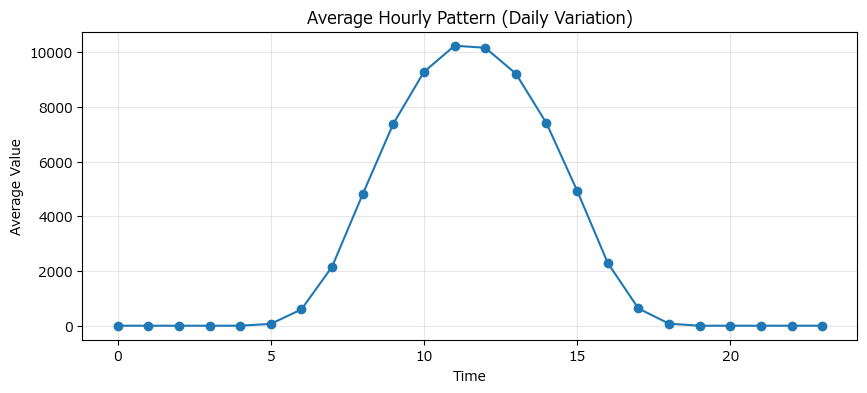

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# From generation
df = df.copy()

# ===== 1. Annual Variation (Monthly Average) =====
monthly_mean = df['solar_gen_mw'].resample('M').mean()
monthly_mean_by_month = monthly_mean.groupby(monthly_mean.index.month).mean()

plt.figure(figsize=(10,4))
monthly_mean_by_month.plot(kind='bar', color='skyblue')
plt.title('Average Monthly Pattern (Annual Variation)')
plt.xlabel('Month')
plt.ylabel('Average Value')
plt.ylim(1500, 3800)
plt.grid(alpha=0.3)
plt.show()

# ===== 2. Weekly Variation (Daily Average) =====
weekly_mean_by_day = df['solar_gen_mw'].groupby(df.index.dayofweek).mean()
days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

plt.figure(figsize=(10,4))
plt.bar(days, weekly_mean_by_day)
plt.title('Average Daily Pattern (Weekly Variation)')
plt.ylabel('Average Value')
plt.ylim(1500, 3500)
plt.grid(alpha=0.3)
plt.show()

# ===== 3. Daily Variation (Hourly Average) =====
hourly_mean_by_hour = df['solar_gen_mw'].groupby(df.index.hour).mean()

plt.figure(figsize=(10,4))
plt.plot(hourly_mean_by_hour.index, hourly_mean_by_hour.values, marker='o')
plt.title('Average Hourly Pattern (Daily Variation)')
plt.xlabel('Time')
plt.ylabel('Average Value')
plt.grid(alpha=0.3)
plt.show()

#### 3-2-2. Demand (e_demand_mw) Cyclical Pattern Analysis

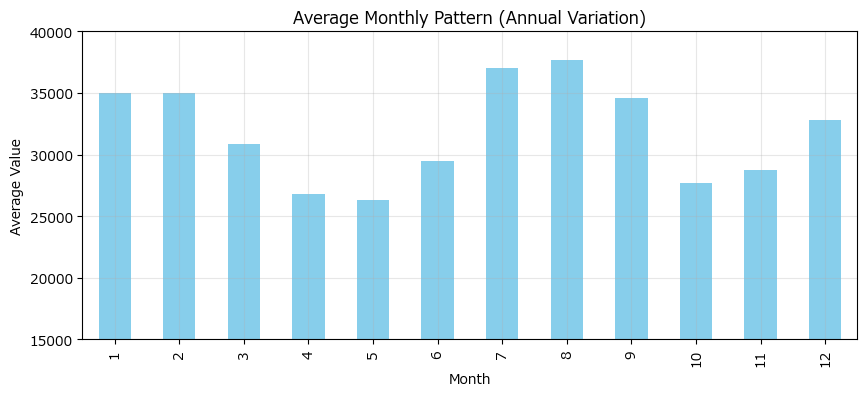

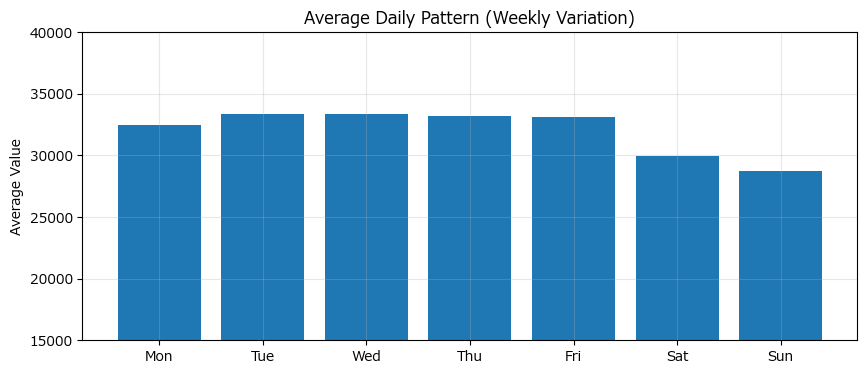

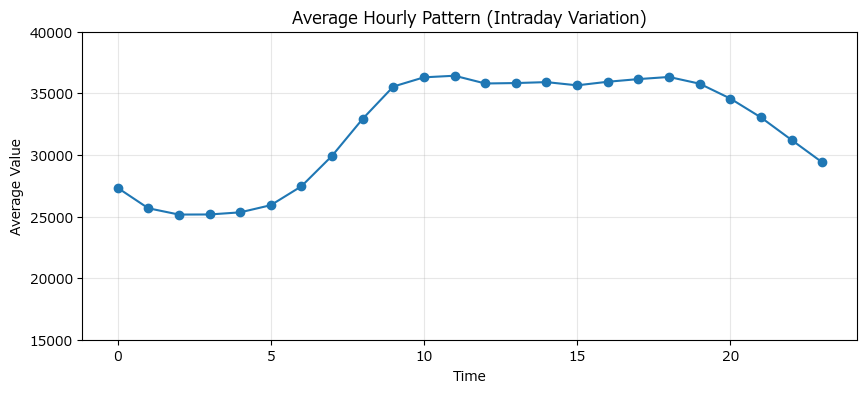

In [4]:
# Consumption

# ===== 1. Annual Variation (Monthly Average) =====
monthly_mean = df['e_demand_mw'].resample('M').mean()
monthly_mean_by_month = monthly_mean.groupby(monthly_mean.index.month).mean()

plt.figure(figsize=(10,4))
monthly_mean_by_month.plot(kind='bar', color='skyblue')
plt.title('Average Monthly Pattern (Annual Variation)')
plt.xlabel('Month')
plt.ylabel('Average Value')
plt.ylim(15000, 40000)
plt.grid(alpha=0.3)
plt.show()

# ===== 2. Weekly Variation (Daily Average) =====
weekly_mean_by_day = df['e_demand_mw'].groupby(df.index.dayofweek).mean()
days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

plt.figure(figsize=(10,4))
plt.bar(days, weekly_mean_by_day)
plt.title('Average Daily Pattern (Weekly Variation)')
plt.ylabel('Average Value')
plt.ylim(15000, 40000)
plt.grid(alpha=0.3)
plt.show()

# ===== 3. Intraday Variation (Hourly Average) =====
hourly_mean_by_hour = df['e_demand_mw'].groupby(df.index.hour).mean()

plt.figure(figsize=(10,4))
plt.plot(hourly_mean_by_hour.index, hourly_mean_by_hour.values, marker='o')
plt.title('Average Hourly Pattern (Intraday Variation)')
plt.xlabel('Time')
plt.ylabel('Average Value')
plt.ylim(15000, 40000)
plt.grid(alpha=0.3)
plt.show()

#### 3-2-3. Discussion of Aggregation Results

**Analysis of Aggregation Results and Identification of Fluctuation Factors**

- Fluctuation patterns by hour, day of the week, and month were shown, aligning with common sense.

Power Generation
| Monthly | Weekly | Daily |
|---|---|---|
| Higher in summer, lower in winter<br>Varies with solar incidence angle, etc. | Changes but slightly | Daytime solar radiation<br>Changes significantly in correlation |

Consumption
| Monthly | Weekly | Daily |
|---|---|---|
| High in both summer and winter<br>Heating and cooling demand | Decreases towards the weekend | Heating, cooling, and daily home and business demand<br>High except late at night |

- Based on the hypothesis that subtracting these average patterns from the original series leaves the sum of trend and noise, we hierarchically subtract monthly, weekly, and daily patterns. This is similar to MSTL but manual, allowing visibility into intermediate steps.

| Step | Content                                   | STL Equivalent    |
| ---- | ----------------------------------------- | ----------------- |
| 1    | Subtract monthly averages to remove annual periodicity | Annual seasonal   |
| 2    | Subtract daily (of week) averages to remove weekly periodicity | Weekly seasonal   |
| 3    | Subtract hourly averages to remove daily periodicity | Daily seasonal    |
| 4    | Extract trend with a smoothed moving average | trend             |
| 5    | Trend difference → Noise residual         | remainder         |

**Analysis**
As a result of time-based aggregation, the main factors influencing variation in each time series were clearly identified.

* Daily Cycle (30-minute intervals): Solar power generation is zero at night and fluctuates in a consistent pattern during the day. Electricity demand does not exhibit clear peaks in the morning and evening; instead, it shows a shallow bimodal pattern, indicating that the structure of demand changes significantly depending on the time of day.

* Weekly Cycle (Day of the week): While no clear differences in power generation are observed based on the day of the week, a clear weekly pattern is evident in electricity demand, with demand decreasing on weekends and maintaining high levels on weekdays. This suggests that the operating status of societal activities (offices and factories) strongly influences electricity demand.

* Monthly Cycle (Month): Power generation varies significantly by season (sunlight hours, sun angle), and it is clear that an annual pattern, where electricity demand peaks in summer and winter due to the influence of air conditioning and heating, is at play.

The periodic patterns identified from these aggregation results provide the basis for their utilization as **external features (calendar variables)** in the construction of the predictive model in the next step.

### 3-3. Hierarchical Time Series Decomposition using Moving Averages

**Attempting Hierarchical Time Series Decomposition Using Moving Averages and Characterizing it as Exploratory Analysis**

Selection of Decomposition Method and Considerations for Application

- Acknowledging the limitations of MSTL decomposition, this section attempts a simple hierarchical time series decomposition based on Moving Average (MA). From the original series, monthly, weekly, and daily seasonality are successively subtracted, and the remaining components are separated as trend and residual.

**[Considerations for Methodological Validity]**
- This method is considered insufficient for the purpose of extracting reliable features for predictive model building. This is because using simple moving averages for trend extraction always results in a delay (lag) in the extracted trend component. This delay also affects the separated seasonal components and residuals, and compared to advanced methods like STL/MSTL, it obscures the separation of each component.
- Therefore, this analysis is not aimed at improving prediction accuracy, but is instead positioned as an exploratory analysis with a limited scope, intended to understand the structure of the time series through a simple procedure.

#### 3-3-1. Hierarchical Decomposition of Power Output (solar_gen_mw)

In [5]:
# Since the DataFrame length will be reduced for Plotly visualization, save the original DataFrame.
df_original = df.copy()

target_col = 'solar_gen_mw'

month_factor = df.groupby(df.index.month)[target_col].transform('mean')
df['adj1'] = df[target_col] - month_factor  # Or df[target_col] / month_factor

weekday_factor = df.groupby(df.index.dayofweek)['adj1'].transform('mean')
df['adj2'] = df['adj1'] - weekday_factor  # Or df['adj1'] / weekday_factor

hour_factor = df.groupby(df.index.hour)['adj2'].transform('mean')
df['adj3'] = df['adj2'] - hour_factor  # Or df['adj2'] / hour_factor

Target column: solar_gen_mw


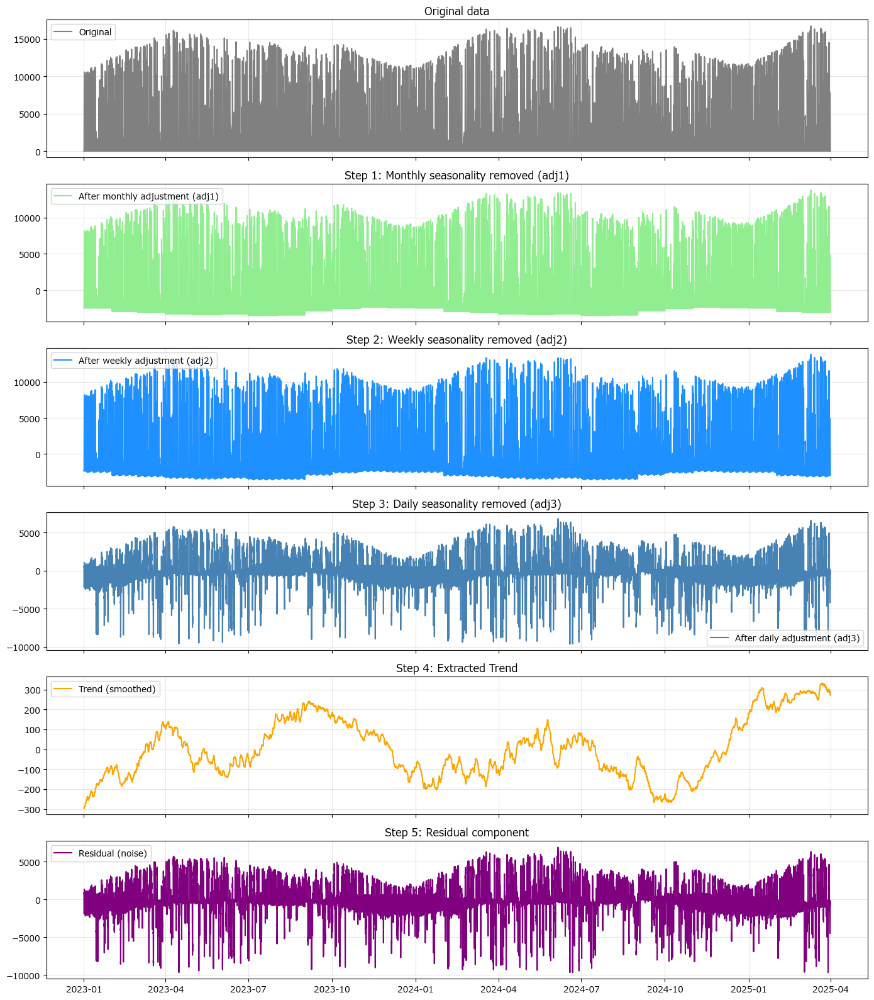

=== Basic statistics ===
                count          mean          std          min          25%  \
solar_gen_mw  39408.0  2.886521e+03  4321.278840     0.000000     0.000000   
adj1          39408.0 -6.499028e-14  4303.194545 -3438.719758 -2870.254902   
adj2          39408.0  7.089849e-14  4302.480350 -3574.241197 -2930.042547   
adj3          39408.0 -1.063477e-13  2012.337691 -9614.143323  -470.979462   
trend         39408.0  2.174187e+00   145.611283  -295.769863  -109.036872   
residual      39408.0 -2.174187e+00  2007.909262 -9654.765697  -487.960869   

                      50%          75%           max  
solar_gen_mw     0.000000  5040.000000  16740.000000  
adj1         -2393.958333  2126.885081  13734.619176  
adj2         -2345.929445  2124.687312  13815.838715  
adj3           -34.122210   552.246579   6797.734513  
trend          -22.960823   109.343282    332.006186  
residual       -20.018290   636.328832   6887.853152  


In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# ==== 0. Initial setup ====
df = df.copy()
if not isinstance(df.index, pd.DatetimeIndex):
    df['datetime'] = pd.to_datetime(df['datetime'])
    df.set_index('datetime', inplace=True)

target_col = 'solar_gen_mw'
print(f"Target column: {target_col}")

# ==== 1. Remove yearly seasonality ====
month_factor = df.groupby(df.index.month)[target_col].transform('mean')
df['adj1'] = df[target_col] - month_factor

# ==== 2. Remove weekly seasonality ====
weekday_factor = df.groupby(df.index.dayofweek)['adj1'].transform('mean')
df['adj2'] = df['adj1'] - weekday_factor

# ==== 3. Remove daily seasonality ====
hour_factor = df.groupby(df.index.hour)['adj2'].transform('mean')
df['adj3'] = df['adj2'] - hour_factor

# ==== 4. Extract trend ====
df['adj3_filled'] = df['adj3'].interpolate('linear', limit_direction='both')
df['trend'] = df['adj3_filled'].rolling(window=4320, center=True, min_periods=1000).mean()

# ==== 5. Residuals ====
df['residual'] = df['adj3'] - df['trend']

# ==== 6. Verify results ====

fig, axes = plt.subplots(6, 1, figsize=(14, 16), sharex=True)

axes[0].plot(df[target_col], label='Original', color='gray')
axes[0].set_title('Original data')

axes[1].plot(df['adj1'], label='After monthly adjustment (adj1)', color='lightgreen')
axes[1].set_title('Step 1: Monthly seasonality removed (adj1)')

axes[2].plot(df['adj2'], label='After weekly adjustment (adj2)', color='dodgerblue')
axes[2].set_title('Step 2: Weekly seasonality removed (adj2)')

axes[3].plot(df['adj3'], label='After daily adjustment (adj3)', color='steelblue')
axes[3].set_title('Step 3: Daily seasonality removed (adj3)')

axes[4].plot(df['trend'], label='Trend (smoothed)', color='orange')
axes[4].set_title('Step 4: Extracted Trend')

axes[5].plot(df['residual'], label='Residual (noise)', color='purple')
axes[5].set_title('Step 5: Residual component')

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

# ==== 7. Check statistics ====
print("=== Basic statistics ===")
print(df[[target_col, 'adj1', 'adj2', 'adj3', 'trend', 'residual']].describe().T)

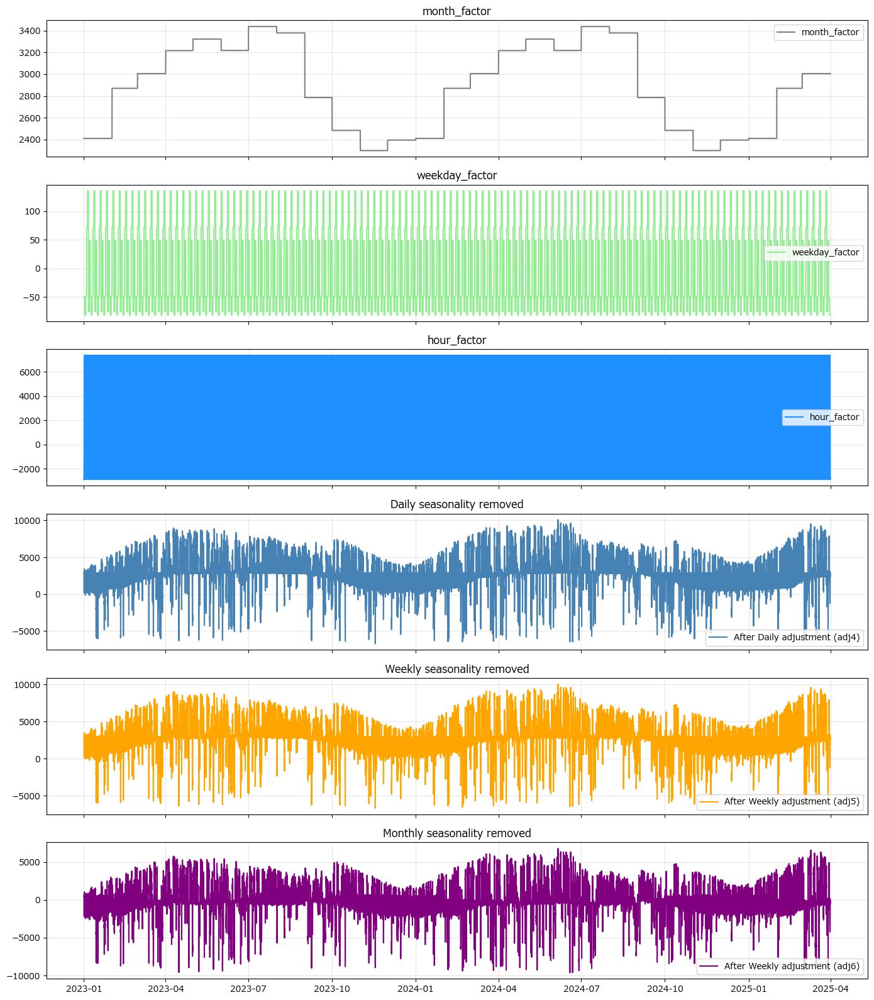

In [7]:
# Display of seasonal components

fig, axes = plt.subplots(6, 1, figsize=(14, 16), sharex=True)

axes[0].plot(month_factor, label='month_factor', color='gray')
axes[0].set_title('month_factor')

axes[1].plot(weekday_factor, label='weekday_factor', color='lightgreen')
axes[1].set_title('weekday_factor')

axes[2].plot(hour_factor, label='hour_factor', color='dodgerblue')
axes[2].set_title('hour_factor')

# Original values with daily variation subtracted
df['adj4'] = df[target_col] - hour_factor

axes[3].plot(df['adj4'], label='After Daily adjustment (adj4)', color='steelblue')
axes[3].set_title('Daily seasonality removed')

# Next, with weekly variation subtracted
df['adj5'] = df['adj4'] - weekday_factor

axes[4].plot(df['adj5'], label='After Weekly adjustment (adj5)', color='orange')
axes[4].set_title('Weekly seasonality removed')

# Additionally, with monthly variation subtracted
df['adj6'] = df['adj5'] - month_factor

axes[5].plot(df['adj6'], label='After Weekly adjustment (adj6)', color='purple')
axes[5].set_title('Monthly seasonality removed')

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

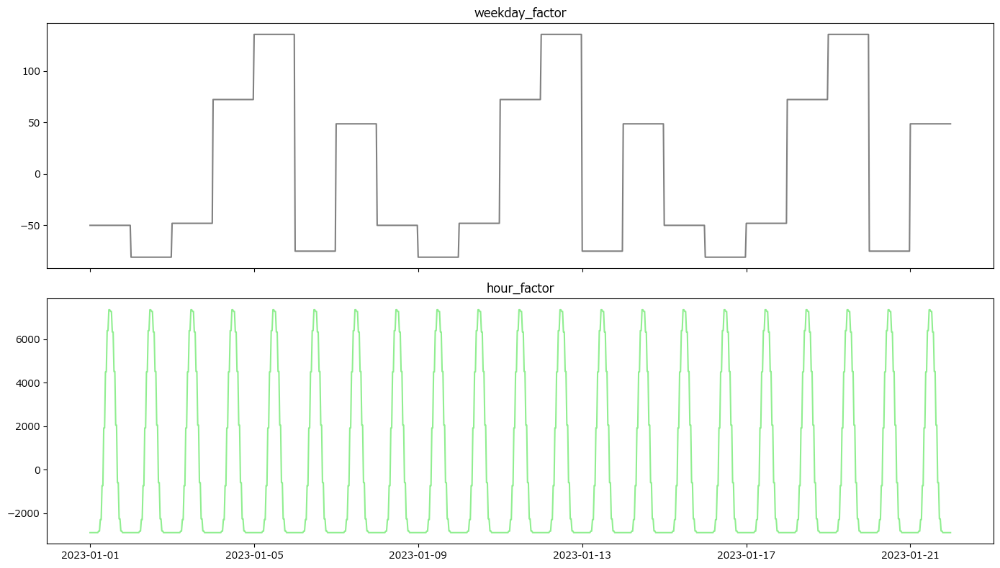

In [8]:
# Magnified view of weekly and daily patterns
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

axes[0].plot(weekday_factor[0:336*3], label='weekday_factor', color='gray')
axes[0].set_title('weekday_factor')

axes[1].plot(hour_factor[0:336*3], label='hour_factor', color='lightgreen')
axes[1].set_title('hour_factor')

plt.tight_layout()
plt.show()

In [9]:
# Limit the data to the first 30 weeks, and display weekly, daily components and differences using plotly.

df['weekday_factor'] = weekday_factor
df['hour_factor'] = hour_factor

df_go = df[0:336*30]

In [10]:
df = df_go
# When using the X-axis as the Index
x_axis = df_go.index
# When using the X-axis as a column
# x_axis = df_go['datetime']

# ----------------------------------------
# 2. Define subplots with make_subplots
# ----------------------------------------
fig = make_subplots(
    rows=7, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=("adj1", "weekday_factor", "adj2", "hour_factor", "adj3", "trend", "residual")

)

# ----------------------------------------
# 3. Add DataFrame columns as traces
# ----------------------------------------

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj1'], name="original-monthly"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['weekday_factor'], name="weekday_factor"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj2'], name="adj1-weekly"),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['hour_factor'], name="hour_factor"),
    row=4, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj3'], name="adj2-hour"),
    row=5, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['trend'], name="trend"),
    row=6, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['residual'], name="residual"),
    row=7, col=1
)
# ----------------------------------------
# 4. Adjust layout
# ----------------------------------------
fig.update_layout(
    title_text="<b>Transition of Various Factors (Graph Objects, Shared X-axis)</b>",
    height=1000,
    # Add a range slider to the bottommost xaxis7
    xaxis7=dict(
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

# Align the x-axis of other subplots with xaxis7
for i in range(1, 7):  # Rows 1 to 6
    fig.update_layout(**{f"xaxis{i}": dict(matches="x7")})

# Set Y-axis labels individually
fig.update_yaxes(title_text="Power Output (MW)", row=1, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=2, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=3, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=4, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=5, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=6, col=1)
fig.update_yaxes(title_text="Power Output (MW)", row=7, col=1)

fig.show()

#### 3-3-2. Hierarchical Decomposition of Demand (e_demand_mw)

In [11]:
# Restore from df_original because the period was shortened in plotly
df = df_original.copy()

target_col = 'e_demand_mw'

month_factor = df.groupby(df.index.month)[target_col].transform('mean')
df['adj1'] = df[target_col] - month_factor  # Or df[target_col] / month_factor

weekday_factor = df.groupby(df.index.dayofweek)['adj1'].transform('mean')
df['adj2'] = df['adj1'] - weekday_factor  # Or df['adj1'] / weekday_factor

hour_factor = df.groupby(df.index.hour)['adj2'].transform('mean')
df['adj3'] = df['adj2'] - hour_factor  # Or df['adj2'] / hour_factor

Target column: e_demand_mw


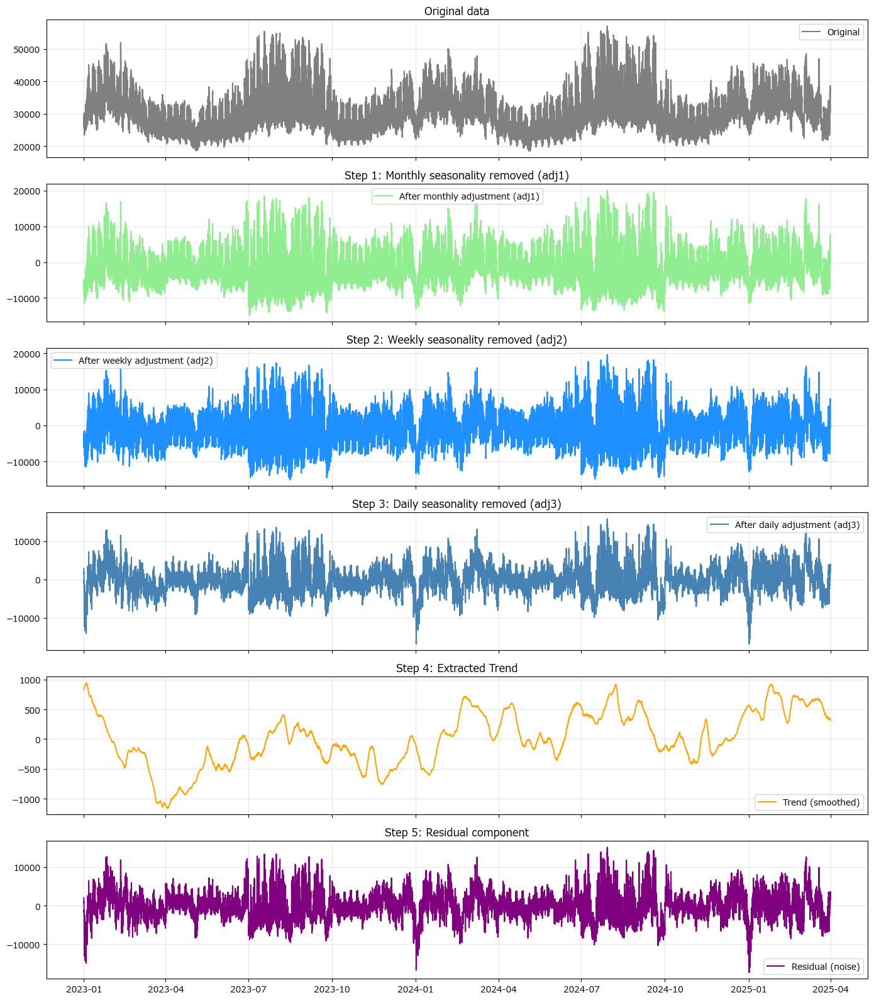

=== Basic statistics ===
               count          mean          std           min           25%  \
e_demand_mw  39408.0  3.203342e+04  7016.028941  18440.000000  26720.000000   
adj1         39408.0 -9.453132e-14  5935.774530 -14886.431452  -4496.592686   
adj2         39408.0 -1.536134e-13  5671.977828 -15071.838914  -4232.394389   
adj3         39408.0  1.536134e-13  3653.309025 -16774.322347  -2227.649448   
trend        39408.0  1.385197e+01   451.339187  -1158.462632   -275.176114   
residual     39408.0 -1.385197e+01  3617.282749 -17341.271071  -2159.118662   

                      50%           75%           max  
e_demand_mw  31150.000000  36420.000000  57080.000000  
adj1          -308.666051   4230.636593  20073.568548  
adj2           273.272571   3730.627119  19658.772427  
adj3          -214.183045   2067.594552  15782.671381  
trend           -4.552579    383.793707    939.316810  
residual      -140.226891   2056.055504  15125.603152  


In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# ==== 0. Prerequisites / Setup ====
df = df.copy()
if not isinstance(df.index, pd.DatetimeIndex):
    df['datetime'] = pd.to_datetime(df['datetime'])
    df.set_index('datetime', inplace=True)

target_col = 'e_demand_mw'
print(f"Target column: {target_col}")

# ==== 1. Remove Monthly Seasonality ====
month_factor = df.groupby(df.index.month)[target_col].transform('mean')
df['adj1'] = df[target_col] - month_factor

# ==== 2. Remove Weekly Seasonality ====
weekday_factor = df.groupby(df.index.dayofweek)['adj1'].transform('mean')
df['adj2'] = df['adj1'] - weekday_factor

# ==== 3. Remove Daily (Intraday) Seasonality ====
hour_factor = df.groupby(df.index.hour)['adj2'].transform('mean')
df['adj3'] = df['adj2'] - hour_factor

# ==== 4. Extract Trend ====
df['adj3_filled'] = df['adj3'].interpolate('linear', limit_direction='both')
df['trend'] = df['adj3_filled'].rolling(window=4320, center=True, min_periods=1000).mean()

# ==== 5. Residuals ====
df['residual'] = df['adj3'] - df['trend']

# ==== 6. Verify Results ====

fig, axes = plt.subplots(6, 1, figsize=(14, 16), sharex=True)

axes[0].plot(df[target_col], label='Original', color='gray')
axes[0].set_title('Original data')

axes[1].plot(df['adj1'], label='After monthly adjustment (adj1)', color='lightgreen')
axes[1].set_title('Step 1: Monthly seasonality removed (adj1)')

axes[2].plot(df['adj2'], label='After weekly adjustment (adj2)', color='dodgerblue')
axes[2].set_title('Step 2: Weekly seasonality removed (adj2)')

axes[3].plot(df['adj3'], label='After daily adjustment (adj3)', color='steelblue')
axes[3].set_title('Step 3: Daily seasonality removed (adj3)')

axes[4].plot(df['trend'], label='Trend (smoothed)', color='orange')
axes[4].set_title('Step 4: Extracted Trend')

axes[5].plot(df['residual'], label='Residual (noise)', color='purple')
axes[5].set_title('Step 5: Residual component')

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

# ==== 7. Statistical Confirmation ====
print("=== Basic statistics ===")
print(df[[target_col, 'adj1', 'adj2', 'adj3', 'trend', 'residual']].describe().T)

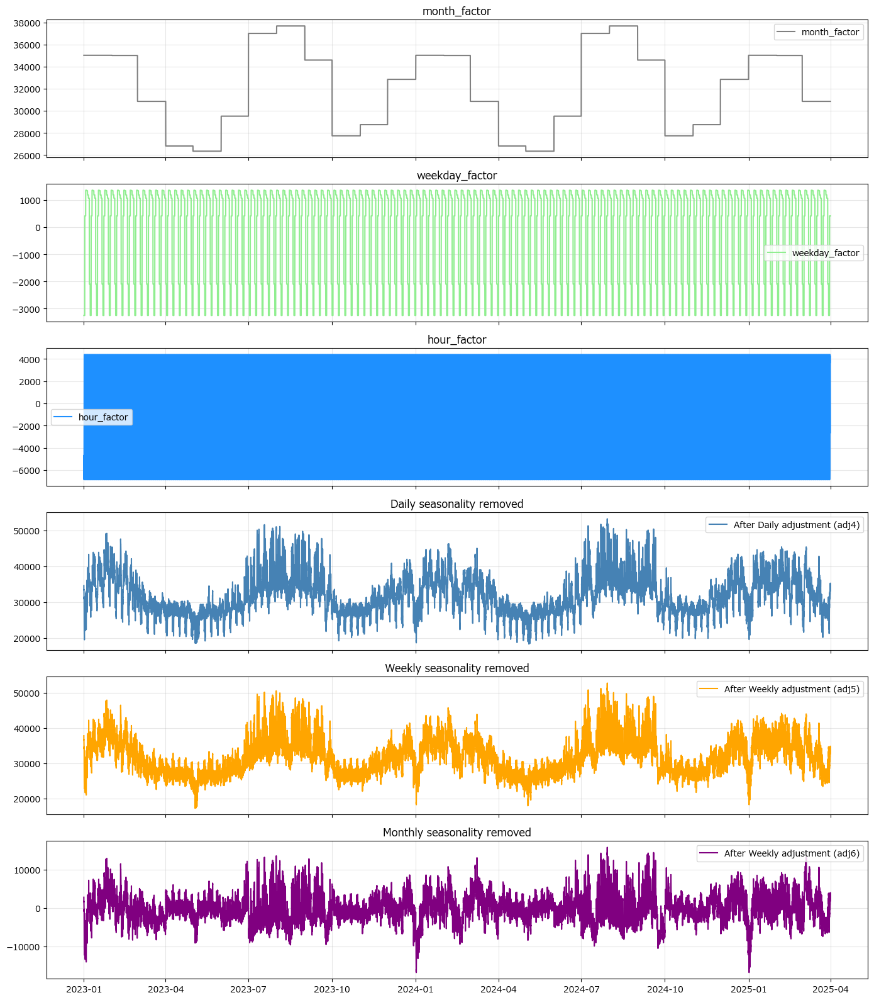

In [13]:
# Display of seasonal factors themselves

fig, axes = plt.subplots(6, 1, figsize=(14, 16), sharex=True)

axes[0].plot(month_factor, label='month_factor', color='gray')
axes[0].set_title('month_factor')

axes[1].plot(weekday_factor, label='weekday_factor', color='lightgreen')
axes[1].set_title('weekday_factor')

axes[2].plot(hour_factor, label='hour_factor', color='dodgerblue')
axes[2].set_title('hour_factor')

# Original values with daily variation subtracted
df['adj4'] = df[target_col] - hour_factor

axes[3].plot(df['adj4'], label='After Daily adjustment (adj4)', color='steelblue')
axes[3].set_title('Daily seasonality removed')

# Next, with weekly variation subtracted
df['adj5'] = df['adj4'] - weekday_factor

axes[4].plot(df['adj5'], label='After Weekly adjustment (adj5)', color='orange')
axes[4].set_title('Weekly seasonality removed')

# Furthermore, with monthly variation subtracted
df['adj6'] = df['adj5'] - month_factor

axes[5].plot(df['adj6'], label='After Weekly adjustment (adj6)', color='purple')
axes[5].set_title('Monthly seasonality removed')

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

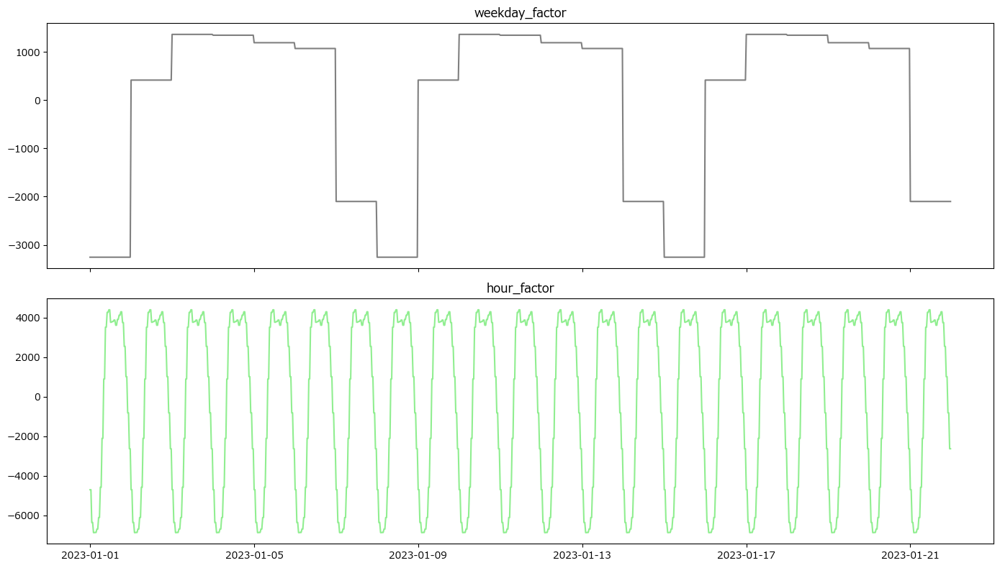

In [14]:
# Enlarged view of weekly and daily patterns
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

axes[0].plot(weekday_factor[0:336*3], label='weekday_factor', color='gray')
axes[0].set_title('weekday_factor')

axes[1].plot(hour_factor[0:336*3], label='hour_factor', color='lightgreen')
axes[1].set_title('hour_factor')

plt.tight_layout()
plt.show()

In [15]:
# Limit the data to the first 30 weeks and display weekly, daily components, and differences using Plotly.

df['weekday_factor'] = weekday_factor
df['hour_factor'] = hour_factor

df_go = df[0:336*30]

In [16]:
df = df_go
# When using the X-axis as Index
x_axis = df_go.index
# When using the X-axis as a column
# x_axis = df_go['datetime']

# ----------------------------------------
# 2. Define subplots with make_subplots
# ----------------------------------------
fig = make_subplots(
    rows=7, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=("adj1", "weekday_factor", "adj2", "hour_factor", "adj3", "trend", "residual")

)

# ----------------------------------------
# 3. Add DataFrame columns as traces
# ----------------------------------------

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj1'], name="original-monthly"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['weekday_factor'], name="weekday_factor"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj2'], name="adj1-weekly"),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['hour_factor'], name="hour_factor"),
    row=4, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['adj3'], name="adj2-hour"),
    row=5, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['trend'], name="trend"),
    row=6, col=1
)

fig.add_trace(
    go.Scatter(x=x_axis, y=df_go['residual'], name="residual"),
    row=7, col=1
)
# ----------------------------------------
# 4. Adjust layout
# ----------------------------------------
fig.update_layout(
    title_text="<b>Transition of Various Factors (Graph Objects, Shared X-axis)</b>",
    height=1000,
    # Add a range slider to xaxis7 on the bottom row
    xaxis7=dict(
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

# Match the x-axis of other subplots to xaxis7
for i in range(1, 7):  # Rows 1 to 6
    fig.update_layout(**{f"xaxis{i}": dict(matches="x7")})

# Set Y-axis labels individually
fig.update_yaxes(title_text="Consumption (MW)", row=1, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=2, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=3, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=4, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=5, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=6, col=1)
fig.update_yaxes(title_text="Consumption (MW)", row=7, col=1)

fig.show()

### 3-4. Conclusion: Integration of Analysis Results and Implications for Model Construction

From the time-based analysis and simplified hierarchical decomposition results obtained in this notebook, the following key insights were gained.

1. Specific Characteristics of Solar Generation

*   Solar power generation is dominated by a daily cycle, with periods of zero values at night (non-operational periods). This zero-value data structure is a major cause of significant bias and noise in the residuals for linear decomposition methods such as moving averages and MSTL.

*   Therefore, when forecasting solar generation, it is suggested that special data processing, such as **masking night-time zero values** or targeting only non-zero data, is essential for ensuring model accuracy.

2. Characteristics of Electricity Demand

*   Electricity demand is influenced by a combination of multiple seasonalities, including daily, weekly, and yearly patterns. The weekly pattern, in particular, clearly reflects the impact of human social activities.

*   As a result of simplified decomposition, the trend component of electricity demand was extracted relatively smoothly, and it likely possesses a time series structure that is more suitable for linear models and SARIMA models compared to solar generation.

3. Transition to Model Building

*   The daily, weekly, and monthly average patterns quantitatively identified in this section are most effectively utilized as **external features (calendar variables)** in the subsequent predictive model construction process. Specifically, adding time of day, day of the week, and month flags as features allows the model to learn periodicity.